In [2]:
import pandas as pd
import matplotlib.pyplot as plt


In [3]:
df = pd.read_csv('data/vestiaire.csv')

In [4]:
df.shape

(900514, 36)

In [5]:
# Remove duplicates
df = df.drop_duplicates()

# Filter sellers with at least 1 product sold
df = df[df['seller_products_sold'] > 0]

In [6]:
df.shape

(822749, 36)

In [7]:
# Check for pass rates outside the range of 0-100%
invalid_pass_rates = df[(df['seller_pass_rate'] < 0) | (df['seller_pass_rate'] > 100)] # found 3

# Filter for valid pass rates (between 0 and 100 inclusive)
df = df[(df['seller_pass_rate'] >= 0) & (df['seller_pass_rate'] <= 100)]

In [8]:
df.shape

(822746, 36)

In [9]:
# Count occurrences of each valid pass rate and sort in ascending order
passrate_count = df['seller_pass_rate'].value_counts().reset_index()
passrate_count.columns = ['seller_pass_rate', 'count']
passrate_count_sorted = passrate_count.sort_values(by='seller_pass_rate', ascending=True)

# Display the sorted result
pd.set_option('display.max_rows', None)  # Set to None to display all rows
print(passrate_count_sorted)


     seller_pass_rate   count
1                 0.0   70433
302               5.0       5
343              10.0       2
185              11.0      31
160              12.0      42
270              14.0       9
277              15.0       7
298              15.7       5
182              16.0      33
271              17.0       9
65               18.0     336
86               20.0     160
230              21.0      15
92               22.0     135
215              23.0      20
90               24.0     148
46               25.0    1503
178              26.0      35
50               27.0    1092
61               28.0     570
180              29.0      34
96               30.0     117
56               31.0     778
73               32.0     225
48               33.0    1334
235              33.3      14
117              34.0      81
116              35.0      81
106              36.0      95
341              36.8       2
72               37.0     237
257              37.5      11
325       

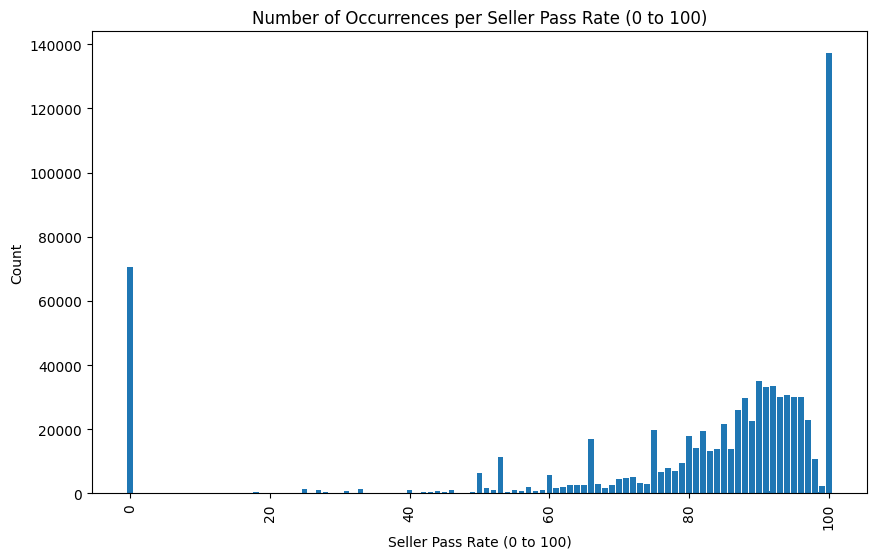

In [10]:
# Plot the distribution of valid seller_pass_rate occurrences
plt.figure(figsize=(10, 6))
plt.bar(passrate_count_sorted['seller_pass_rate'], passrate_count_sorted['count'])
plt.xlabel('Seller Pass Rate (0 to 100)')
plt.ylabel('Count')
plt.title('Number of Occurrences per Seller Pass Rate (0 to 100)')
plt.xticks(rotation=90)
plt.show()

In [11]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 822746 entries, 0 to 900513
Data columns (total 36 columns):
 #   Column                      Non-Null Count   Dtype  
---  ------                      --------------   -----  
 0   product_id                  822746 non-null  int64  
 1   product_type                822746 non-null  object 
 2   product_name                822746 non-null  object 
 3   product_description         822739 non-null  object 
 4   product_keywords            821670 non-null  object 
 5   product_gender_target       822746 non-null  object 
 6   product_category            821670 non-null  object 
 7   product_season              822744 non-null  object 
 8   product_condition           822746 non-null  object 
 9   product_like_count          822746 non-null  float64
 10  sold                        822746 non-null  bool   
 11  reserved                    822746 non-null  bool   
 12  available                   822746 non-null  bool   
 13  in_stock      

In [12]:
missing_values = df.isnull().sum()
print(missing_values)

product_id                        0
product_type                      0
product_name                      0
product_description               7
product_keywords               1076
product_gender_target             0
product_category               1076
product_season                    2
product_condition                 0
product_like_count                0
sold                              0
reserved                          0
available                         0
in_stock                          0
should_be_gone                    0
brand_id                          0
brand_name                        0
brand_url                         0
product_material                  4
product_color                     1
price_usd                         0
seller_price                      0
seller_earning                    0
seller_badge                      0
has_cross_border_fees         13724
buyers_fees                   13724
warehouse_name                    0
seller_id                   

In [13]:
df["usually_ships_within"].unique()

array([nan, '1-2 days', '3-5 days', '6-7 days', 'More than 7 days'],
      dtype=object)

In [14]:
from scipy.stats import pointbiserialr

# Step 1: Create an indicator for missing values in "usually ships within"
df['missing_ships_within'] = df['usually_ships_within'].isnull().astype(int)

# Step 2: Calculate point-biserial correlation between missing_ships_within and seller_pass_rate
corr, p_value = pointbiserialr(df['missing_ships_within'], df['seller_pass_rate'])

# Step 3: Print the results
print(f'Point-Biserial Correlation: {corr}')
print(f'P-value: {p_value}')

# it holds information (informative missingness), so we imput it with its own category "unknown"


Point-Biserial Correlation: -0.23444633055108954
P-value: 0.0


In [15]:
# Replacing missing values with 'unknown'
df['usually_ships_within'] = df['usually_ships_within'].fillna('unknown')

# Verify the result
print(df['usually_ships_within'].isnull().sum())

0


In [16]:
df["has_cross_border_fees"].unique()

array([nan, True], dtype=object)

In [17]:
df["has_cross_border_fees"].isnull().sum()

13724

In [18]:
# Check for rows with missing values in both 'buyers_fees' and 'has_cross_border_fees'
missing_in_both = df['buyers_fees'].isnull() & df['has_cross_border_fees'].isnull()

# Count rows with missing values in both columns
count_missing_in_both = missing_in_both.sum()

# Check for rows with missing values in 'buyers_fees' but not in 'has_cross_border_fees'
missing_in_buyers_fees_only = df['buyers_fees'].isnull() & df['has_cross_border_fees'].notnull()

# Check for rows with missing values in 'has_cross_border_fees' but not in 'buyers_fees'
missing_in_cross_border_fees_only = df['buyers_fees'].notnull() & df['has_cross_border_fees'].isnull()

# Print the results
print(f"Rows with missing values in both 'buyers_fees' and 'has_cross_border_fees': {count_missing_in_both}")
print(f"Rows with missing values in 'buyers_fees' only: {missing_in_buyers_fees_only.sum()}")
print(f"Rows with missing values in 'has_cross_border_fees' only: {missing_in_cross_border_fees_only.sum()}")

# same rows have missing values, so we fill them accordingly (when has fees is not true, it's NA, and buyer fees is NA --> no fees = 0 fees)

Rows with missing values in both 'buyers_fees' and 'has_cross_border_fees': 13724
Rows with missing values in 'buyers_fees' only: 0
Rows with missing values in 'has_cross_border_fees' only: 0


In [19]:
# Fill missing values in has_cross_border_fees with False
df['has_cross_border_fees'] = df['has_cross_border_fees'].fillna(False)

# Impute buyers_fees where has_cross_border_fees is False and buyers_fees is missing
df.loc[(df['has_cross_border_fees'] == False) & (df['buyers_fees'].isnull()), 'buyers_fees'] = 0

# Verify the result
print(df[['has_cross_border_fees', 'buyers_fees']].isnull().sum())

has_cross_border_fees    0
buyers_fees              0
dtype: int64


In [20]:
missing_values = df.isnull().sum()
print(missing_values)

product_id                       0
product_type                     0
product_name                     0
product_description              7
product_keywords              1076
product_gender_target            0
product_category              1076
product_season                   2
product_condition                0
product_like_count               0
sold                             0
reserved                         0
available                        0
in_stock                         0
should_be_gone                   0
brand_id                         0
brand_name                       0
brand_url                        0
product_material                 4
product_color                    1
price_usd                        0
seller_price                     0
seller_earning                   0
seller_badge                     0
has_cross_border_fees            0
buyers_fees                      0
warehouse_name                   0
seller_id                        0
seller_username     

In [21]:
df["product_category"].value_counts()

Women Clothing       174166
Men Clothing         172590
Women Accessories    142478
Women Shoes          125414
Men Shoes            114303
Men Accessories       92719
Name: product_category, dtype: int64

In [22]:
df["product_keywords"].value_counts()

Gucci Plastic Sunglasses                                                             3884
Hermès Silk Scarves                                                                  2460
Hermès Silk Ties                                                                     2362
Burberry Cotton Coats                                                                2225
Prada Plastic Sunglasses                                                             2113
Gucci Leather Trainers                                                               1678
Louis Vuitton Leather Wallets                                                        1675
Gucci Metal Sunglasses                                                               1634
Gucci Leather Flats                                                                  1611
Polo Ralph Lauren Cotton Knitwear & Sweatshirts                                      1434
Burberry Cotton Jackets                                                              1390
Louis Vuit

In [23]:
# Check for rows with missing values in both 'product_keywords' and 'product_category'
missing_in_both = df['product_keywords'].isnull() & df['product_category'].isnull()

# Count rows with missing values in both columns
count_missing_in_both = missing_in_both.sum()

# Check for rows with missing values in 'product_keywords' but not in 'product_category'
missing_in_keywords_only = df['product_keywords'].isnull() & df['product_category'].notnull()

# Check for rows with missing values in 'product_category' but not in 'product_keywords'
missing_in_category_only = df['product_keywords'].notnull() & df['product_category'].isnull()

# Print the results
print(f"Rows with missing values in both columns: {count_missing_in_both}")
print(f"Rows with missing values in 'product_keywords' only: {missing_in_keywords_only.sum()}")
print(f"Rows with missing values in 'product_category' only: {missing_in_category_only.sum()}")

# also the same missing rows

Rows with missing values in both columns: 1076
Rows with missing values in 'product_keywords' only: 0
Rows with missing values in 'product_category' only: 0


In [24]:
from scipy.stats import pointbiserialr

# Create binary indicators for missingness
df['missing_product_keywords'] = df['product_keywords'].isnull().astype(int)
df['missing_product_category'] = df['product_category'].isnull().astype(int)

# Check the correlation between missingness and seller_pass_rate
keywords_corr, keywords_p_value = pointbiserialr(df['missing_product_keywords'], df['seller_pass_rate'])
category_corr, category_p_value = pointbiserialr(df['missing_product_category'], df['seller_pass_rate'])

# Print the results
print(f"Correlation between missing 'product_keywords' and 'seller_pass_rate': {keywords_corr}")
print(f"P-value for 'product_keywords': {keywords_p_value}")
print(f"Correlation between missing 'product_category' and 'seller_pass_rate': {category_corr}")
print(f"P-value for 'product_category': {category_p_value}")

#no correlation of missingness with pass rate


Correlation between missing 'product_keywords' and 'seller_pass_rate': 0.004324857435676334
P-value for 'product_keywords': 8.749334584271463e-05
Correlation between missing 'product_category' and 'seller_pass_rate': 0.004324857435676334
P-value for 'product_category': 8.749334584271463e-05


In [25]:
from scipy import stats

# Example DataFrame
# df = pd.read_csv('your_data.csv')

# Create a new binary column for missingness
df['missing_product_keywords'] = df['product_keywords'].isna().astype(int)

# T-test for seller_pass_rate based on missingness in product_keywords
t_stat, p_value = stats.ttest_ind(
    df[df['missing_product_keywords'] == 0]['seller_pass_rate'],
    df[df['missing_product_keywords'] == 1]['seller_pass_rate'],
    equal_var=False
)
print("T-test p-value for product_keywords:", p_value)

# Chi-squared test
contingency_table = pd.crosstab(df['missing_product_keywords'], df['product_category'])
chi2, p, _, _ = stats.chi2_contingency(contingency_table)
print("Chi-squared test p-value for product_keywords:", p)

#not MAR, maybe MCAR (missingness independent of both observed and unobserved data)


T-test p-value for product_keywords: 2.951356352149273e-05
Chi-squared test p-value for product_keywords: 1.0


In [26]:
# we will use a simple method : mode imputation

# Impute missing values with the mode for 'product_keywords' and 'product_category'
df['product_keywords'] = df['product_keywords'].fillna(df['product_keywords'].mode()[0])
df['product_category'] = df['product_category'].fillna(df['product_category'].mode()[0])

# Verify the imputation
print("Imputed 'product_keywords':", df['product_keywords'].isnull().sum())
print("Imputed 'product_category':", df['product_category'].isnull().sum())


Imputed 'product_keywords': 0
Imputed 'product_category': 0


In [27]:
missing_values = df.isnull().sum()
print(missing_values)

product_id                     0
product_type                   0
product_name                   0
product_description            7
product_keywords               0
product_gender_target          0
product_category               0
product_season                 2
product_condition              0
product_like_count             0
sold                           0
reserved                       0
available                      0
in_stock                       0
should_be_gone                 0
brand_id                       0
brand_name                     0
brand_url                      0
product_material               4
product_color                  1
price_usd                      0
seller_price                   0
seller_earning                 0
seller_badge                   0
has_cross_border_fees          0
buyers_fees                    0
warehouse_name                 0
seller_id                      0
seller_username               38
usually_ships_within           0
seller_cou

In [28]:
# Impute missing seller usernames with 'unknown'
df['seller_username'] = df['seller_username'].fillna('unknown')

In [29]:
# Impute missing values with the mode for each specified column
df['product_season'] = df['product_season'].fillna(df['product_season'].mode()[0])
df['product_material'] = df['product_material'].fillna(df['product_material'].mode()[0])
df['product_color'] = df['product_color'].fillna(df['product_color'].mode()[0])

In [30]:
df['product_description'].fillna("No Description", inplace=True)

# impute with empty string, useful for later when calculating description length

In [31]:
missing_values = df.isnull().sum()
print(missing_values)

product_id                    0
product_type                  0
product_name                  0
product_description           0
product_keywords              0
product_gender_target         0
product_category              0
product_season                0
product_condition             0
product_like_count            0
sold                          0
reserved                      0
available                     0
in_stock                      0
should_be_gone                0
brand_id                      0
brand_name                    0
brand_url                     0
product_material              0
product_color                 0
price_usd                     0
seller_price                  0
seller_earning                0
seller_badge                  0
has_cross_border_fees         0
buyers_fees                   0
warehouse_name                0
seller_id                     0
seller_username               0
usually_ships_within          0
seller_country                0
seller_p

In [32]:
df.shape

(822746, 39)

In [33]:

df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 822746 entries, 0 to 900513
Data columns (total 39 columns):
 #   Column                      Non-Null Count   Dtype  
---  ------                      --------------   -----  
 0   product_id                  822746 non-null  int64  
 1   product_type                822746 non-null  object 
 2   product_name                822746 non-null  object 
 3   product_description         822746 non-null  object 
 4   product_keywords            822746 non-null  object 
 5   product_gender_target       822746 non-null  object 
 6   product_category            822746 non-null  object 
 7   product_season              822746 non-null  object 
 8   product_condition           822746 non-null  object 
 9   product_like_count          822746 non-null  float64
 10  sold                        822746 non-null  bool   
 11  reserved                    822746 non-null  bool   
 12  available                   822746 non-null  bool   
 13  in_stock      

In [43]:
df.columns

Index(['product_id', 'product_type', 'product_name', 'product_description',
       'product_keywords', 'product_gender_target', 'product_category',
       'product_season', 'product_condition', 'product_like_count', 'sold',
       'reserved', 'available', 'in_stock', 'should_be_gone', 'brand_id',
       'brand_name', 'product_material', 'product_color', 'price_usd',
       'seller_price', 'seller_earning', 'seller_badge',
       'has_cross_border_fees', 'buyers_fees', 'warehouse_name', 'seller_id',
       'seller_username', 'usually_ships_within', 'seller_country',
       'seller_products_sold', 'seller_num_products_listed',
       'seller_community_rank', 'seller_num_followers', 'seller_pass_rate',
       'missing_ships_within', 'missing_product_keywords',
       'missing_product_category'],
      dtype='object')

In [45]:
df.shape

(822746, 38)

In [46]:
df
# Display numerical columns in the DataFrame
nums = df.select_dtypes(include='number').columns
print("Numerical columns:", nums)


Numerical columns: Index(['product_id', 'product_like_count', 'brand_id', 'price_usd',
       'seller_price', 'seller_earning', 'buyers_fees', 'seller_id',
       'seller_products_sold', 'seller_num_products_listed',
       'seller_community_rank', 'seller_num_followers', 'seller_pass_rate',
       'missing_ships_within', 'missing_product_keywords',
       'missing_product_category'],
      dtype='object')


In [34]:
df.drop(columns=['brand_url'], inplace=True)

#dropping also product_id, brand_id, seller_username

In [92]:
# Aggregate numerical columns by seller_id
numerical_agg = df.groupby('seller_id').agg({
    'product_like_count': ['mean', 'sum'],           # Mean and total likes per seller
    'price_usd': ['mean', 'max'],                    # Mean and maximum price per seller
    'seller_price': 'mean',                           # Average seller price per seller
    'seller_earning': ['mean', 'sum'],                # Average seller earnings per seller
    'seller_products_sold': 'sum',                    # Total products sold by each seller
    'seller_num_products_listed': 'sum',              # Total number of products listed per seller
    'seller_community_rank': 'median',                # Median of community rank per seller
    'seller_num_followers': 'mean',                   # Average number of followers per seller
    'seller_pass_rate': 'mean'                        # Average seller pass rate
}).reset_index()

# Flatten the multi-level columns for easier access
numerical_agg.columns = [col[0] if col[0] == 'seller_id' else '_'.join(map(str, col)).strip() for col in numerical_agg.columns]

In [93]:
numerical_agg.head()

,seller_id,product_like_count_mean,product_like_count_sum,price_usd_mean,price_usd_max,seller_price_mean,seller_earning_mean,seller_earning_sum,seller_products_sold_sum,seller_num_products_listed_sum,seller_community_rank_median,seller_num_followers_mean,seller_pass_rate_mean
0,1,13.000000,13.0,204.48,204.48,170.40,170.40,170.40,63.0,2.0,0.0,3972.0,98.0
1,4,17.000000,17.0,562.32,562.32,468.60,407.68,407.68,51.0,3.0,157169.0,321.0,76.0
2,6,4.666667,14.0,315.24,536.76,262.70,228.55,685.65,750.0,15.0,21952.0,993.0,96.0
3,12,4.000000,4.0,76.68,76.68,63.90,53.25,53.25,256.0,13.0,10764.0,768.0,93.0
4,33,11.000000,22.0,467.75,728.46,389.79,389.79,779.58,822.0,16.0,11051.0,585583.0,96.0


In [42]:
numerical_agg.shape

(141447, 13)

In [47]:
numerical_agg.describe()

,seller_id_,product_like_count_mean,product_like_count_sum,price_usd_mean,price_usd_max,seller_price_mean,seller_earning_mean,seller_earning_sum,seller_products_sold_sum,seller_num_products_listed_sum,seller_community_rank_median,seller_num_followers_mean,seller_pass_rate_mean
count,1.414470e+05,141447.000000,141447.000000,141447.000000,141447.000000,141447.000000,141447.000000,1.414470e+05,1.414470e+05,1.414470e+05,1.414470e+05,1.414470e+05,141447.000000
mean,1.274528e+07,8.619584,37.139614,347.307124,580.767608,292.424247,255.693721,1.685738e+03,4.233418e+03,9.508388e+03,9.874639e+04,1.989479e+02,70.656019
std,7.705690e+06,12.786195,187.847118,1542.869901,3339.909874,1299.691254,1216.222948,3.252010e+04,4.502374e+05,1.270339e+06,1.824112e+05,3.771093e+04,37.242839
min,1.000000e+00,0.000000,0.000000,6.130000,6.130000,5.110000,0.000000,0.000000e+00,1.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000
25%,6.195919e+06,2.000000,4.000000,92.037500,113.740000,77.393333,63.900000,1.091600e+02,4.000000e+00,3.000000e+00,0.000000e+00,9.000000e+00,64.572222
50%,1.221366e+07,5.000000,11.000000,174.287500,236.430000,146.670000,127.215000,2.758700e+02,1.700000e+01,1.200000e+01,1.735000e+03,2.400000e+01,88.000000
75%,1.907556e+07,10.500000,30.000000,343.049603,497.250000,288.000000,253.260000,7.194850e+02,8.000000e+01,5.700000e+01,1.133305e+05,7.100000e+01,100.000000
max,2.608177e+07,520.000000,15094.000000,316352.285000,632610.000000,263626.905000,254647.360000,8.039462e+06,1.451823e+08,4.246123e+08,1.064736e+06,1.416956e+07,100.000000


In [48]:
# Check for missing values in the aggregated DataFrame
print(numerical_agg.isnull().sum())

seller_id_                        0
product_like_count_mean           0
product_like_count_sum            0
price_usd_mean                    0
price_usd_max                     0
seller_price_mean                 0
seller_earning_mean               0
seller_earning_sum                0
seller_products_sold_sum          0
seller_num_products_listed_sum    0
seller_community_rank_median      0
seller_num_followers_mean         0
seller_pass_rate_mean             0
dtype: int64


In [50]:
# Identify boolean columns
bool_columns = df.select_dtypes(include='bool').columns

# Convert boolean columns to 1/0
df[bool_columns] = df[bool_columns].astype(int)

# Verify conversion
print(df[bool_columns].head())

   sold  reserved  available  in_stock  should_be_gone  has_cross_border_fees
0     1         0          1         0               0                      0
2     0         0          1         0               0                      1
3     0         0          1         0               0                      1
4     0         0          1         0               0                      1
5     0         0          1         0               0                      1


In [51]:
df.dtypes[bool_columns]

sold                     int64
reserved                 int64
available                int64
in_stock                 int64
should_be_gone           int64
has_cross_border_fees    int64
dtype: object

In [59]:
# Aggregate boolean columns including the converted ones and the additional binary columns
boolean_agg = df.groupby('seller_id').agg({
    'sold': 'sum',                                   # Count of sold products
    'reserved': 'sum',                               # Count of reserved products
    'available': 'sum',                              # Count of available products
    'in_stock': 'sum',                               # Count of in-stock products
    'should_be_gone': 'sum',                         # Count of products flagged as "should be gone"
    'has_cross_border_fees': 'sum',                  # If any product has cross-border fees
    'missing_ships_within': 'sum',                   # Sum for missing_ships_within
    'missing_product_keywords': 'sum',               # Sum for missing_product_keywords
    'missing_product_category': 'sum',               # Sum for missing_product_category
}).reset_index()

In [60]:
# Check the result of the aggregation
boolean_agg.head()

,seller_id,sold,reserved,available,in_stock,should_be_gone,has_cross_border_fees,missing_ships_within,missing_product_keywords,missing_product_category
0,1,0,0,1,0,0,1,1,0,0
1,4,0,0,1,0,0,1,1,0,0
2,6,0,0,3,0,0,3,0,0,0
3,12,0,0,1,1,0,1,1,0,0
4,33,0,0,2,0,0,2,0,0,0


In [58]:
boolean_agg.shape 

(141447, 10)

In [63]:
boolean_agg["reserved"].nunique()
#drop reserved? all are "False"

1

In [66]:
boolean_agg["should_be_gone"].nunique()
#drop? 

6

In [67]:
boolean_agg.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 141447 entries, 0 to 141446
Data columns (total 10 columns):
 #   Column                    Non-Null Count   Dtype
---  ------                    --------------   -----
 0   seller_id                 141447 non-null  int64
 1   sold                      141447 non-null  int64
 2   reserved                  141447 non-null  int64
 3   available                 141447 non-null  int64
 4   in_stock                  141447 non-null  int64
 5   should_be_gone            141447 non-null  int64
 6   has_cross_border_fees     141447 non-null  int64
 7   missing_ships_within      141447 non-null  int64
 8   missing_product_keywords  141447 non-null  int64
 9   missing_product_category  141447 non-null  int64
dtypes: int64(10)
memory usage: 10.8 MB


In [ ]:
categorical_columns = df.select_dtypes(include='object').columns

In [70]:
# DROPPING UNNECESSARY COLUMNS
# Define the columns to drop
columns_to_drop = [
    'product_id',           
    'seller_username',    
    'brand_id'              
]

# Drop the columns from the DataFrame
df = df.drop(columns=columns_to_drop)

In [71]:
df.shape

(822746, 35)

In [72]:
# Calculate average length and average word count directly during aggregation
text_metrics_agg = df.groupby('seller_id').agg(
    avg_product_description_length=('product_description', lambda x: x.str.len().mean()),  # Average length of product descriptions
    avg_product_name_length=('product_name', lambda x: x.str.len().mean()),                    # Average length of product names
    avg_product_keywords_length=('product_keywords', lambda x: x.str.len().mean()),            # Average length of product keywords
    avg_product_description_wordcount=('product_description', lambda x: x.str.split().str.len().mean()),  # Average word count for product descriptions
    avg_product_name_wordcount=('product_name', lambda x: x.str.split().str.len().mean()),                # Average word count for product names
    avg_product_keywords_wordcount=('product_keywords', lambda x: x.str.split().str.len().mean())         # Average word count for product keywords
).reset_index()

In [75]:
text_metrics_agg.head()

,seller_id,avg_product_description_length,avg_product_name_length,avg_product_keywords_length,avg_product_description_wordcount,avg_product_name_wordcount,avg_product_keywords_wordcount
0,1,197.000000,43.0,26.000000,34.0,6.000000,3.0
1,4,74.000000,45.0,45.000000,12.0,7.000000,7.0
2,6,43.666667,57.0,25.666667,8.0,10.333333,4.0
3,12,189.000000,54.0,22.000000,33.0,10.000000,3.0
4,33,66.000000,53.5,22.500000,11.5,9.500000,3.5


In [76]:
text_metrics_agg.shape

(141447, 7)

In [77]:
# Define categorical columns for aggregation
categorical_columns = {
    'product_type': ['nunique', lambda x: x.value_counts().idxmax()],  # Count of unique values and most common value
    'product_gender_target': ['nunique', lambda x: x.value_counts().idxmax()],  # Count of unique values and most common value
    'product_category': ['nunique', lambda x: x.value_counts().idxmax()],  # Count of unique values and most common value
    'product_season': ['nunique', lambda x: x.value_counts().idxmax()],  # Count of unique values and most common value
    'product_condition': ['nunique', lambda x: x.value_counts().idxmax()],  # Count of unique values and most common value
    'brand_name': ['nunique', lambda x: x.value_counts().idxmax()], # Count of unique values and most common value
    'product_material': ['nunique', lambda x: x.value_counts().idxmax()],  # Count of unique values and most common value
    'product_color': ['nunique', lambda x: x.value_counts().idxmax()],  # Count of unique values and most common value
    'seller_badge': [lambda x: x.value_counts().idxmax()],  # Most common value only
    'warehouse_name': ['nunique', lambda x: x.value_counts().idxmax()],  # Count of unique values and most common value
    'usually_ships_within': ['nunique', lambda x: x.value_counts().idxmax()],  # Count of unique values and most common value
    'seller_country': [lambda x: x.value_counts().idxmax()],  # Most common value only
}

# Aggregate categorical columns
categorical_agg = df.groupby('seller_id').agg({col: funcs for col, funcs in categorical_columns.items()}).reset_index()

# Rename columns for clarity
categorical_agg.columns = ['seller_id'] + [
    f"{col}_{func.__name__}" if func.__name__ == 'nunique' else f"{col}_most_common" 
    for col in categorical_columns.keys() 
    for func in categorical_columns[col]
]

# Display the aggregated dataframe
print(categorical_agg.head())


array(['Common', 'Expert', 'Trusted'], dtype=object)

In [80]:
# Define aggregation functions for categorical columns
categorical_agg = df.groupby('seller_id').agg({
    'product_type': ['nunique', lambda x: x.value_counts().idxmax()],  # Count of unique values and most common value
    'product_gender_target': ['nunique', lambda x: x.value_counts().idxmax()],  # Count of unique values and most common value
    'product_category': ['nunique', lambda x: x.value_counts().idxmax()],  # Count of unique values and most common value
    'product_season': ['nunique', lambda x: x.value_counts().idxmax()],  # Count of unique values and most common value
    'product_condition': ['nunique', lambda x: x.value_counts().idxmax()],  # Count of unique values and most common value
    'brand_name': ['nunique', lambda x: x.value_counts().idxmax()],  # Count of unique values and most common value
    'product_material': ['nunique', lambda x: x.value_counts().idxmax()],  # Count of unique values and most common value
    'product_color': ['nunique', lambda x: x.value_counts().idxmax()],  # Count of unique values and most common value
    'seller_badge': [lambda x: x.value_counts().idxmax()],  # Most common value only
    'warehouse_name': ['nunique', lambda x: x.value_counts().idxmax()],  # Count of unique values and most common value
    'usually_ships_within': ['nunique', lambda x: x.value_counts().idxmax()],  # Count of unique values and most common value
    'seller_country': [lambda x: x.value_counts().idxmax()]  # Most common value only
}).reset_index()

#buyers_Fees drop?

In [81]:
# Flatten the MultiIndex columns without loops
categorical_agg.columns = ['seller_id'] + [f"{col}_{func}" if func == 'nunique' else f"{col}_most_common"
                                           for col, func in categorical_agg.columns[1:]]

In [83]:
categorical_agg.head()

,seller_id,product_type_nunique,product_type_most_common,product_gender_target_nunique,product_gender_target_most_common,product_category_nunique,product_category_most_common,product_season_nunique,product_season_most_common,product_condition_nunique,...,product_material_nunique,product_material_most_common,product_color_nunique,product_color_most_common,seller_badge_most_common,warehouse_name_nunique,warehouse_name_most_common,usually_ships_within_nunique,usually_ships_within_most_common,seller_country_most_common
0,1,1,Leather wallet,1,Women,1,Women Accessories,1,All seasons,1,...,1,Leather,1,Brown,Common,1,Tourcoing,1,unknown,France
1,4,1,Leather purse,1,Women,1,Women Accessories,1,All seasons,1,...,1,Leather,1,Black,Common,1,Tourcoing,1,unknown,France
2,6,3,Leather boots,1,Men,1,Men Shoes,1,All seasons,2,...,2,Leather,3,Black,Common,1,Tourcoing,1,6-7 days,France
3,12,1,Leather low trainers,1,Men,1,Men Shoes,1,All seasons,1,...,1,Leather,1,Navy,Trusted,1,Tourcoing,1,unknown,France
4,33,2,Leather boots,1,Women,1,Women Shoes,1,All seasons,2,...,1,Leather,1,Black,Expert,1,Tourcoing,1,1-2 days,France


In [86]:
categorical_agg.shape

(141447, 23)

In [98]:
# merging the aggregated data into one df
df = numerical_agg.merge(boolean_agg, on='seller_id', how='left') \
                           .merge(text_metrics_agg, on='seller_id', how='left') \
                           .merge(categorical_agg, on='seller_id', how='left')

In [99]:
df.shape

(141447, 50)

In [106]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 141447 entries, 0 to 141446
Data columns (total 50 columns):
 #   Column                             Non-Null Count   Dtype  
---  ------                             --------------   -----  
 0   seller_id                          141447 non-null  int64  
 1   product_like_count_mean            141447 non-null  float64
 2   product_like_count_sum             141447 non-null  float64
 3   price_usd_mean                     141447 non-null  float64
 4   price_usd_max                      141447 non-null  float64
 5   seller_price_mean                  141447 non-null  float64
 6   seller_earning_mean                141447 non-null  float64
 7   seller_earning_sum                 141447 non-null  float64
 8   seller_products_sold_sum           141447 non-null  float64
 9   seller_num_products_listed_sum     141447 non-null  float64
 10  seller_community_rank_median       141447 non-null  float64
 11  seller_num_followers_mean          1414

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Histogram
plt.figure(figsize=(10, 5))
sns.histplot(df['seller_pass_rate'], bins=30, kde=True)
plt.title('Distribution of Seller Pass Rate')
plt.xlabel('Seller Pass Rate')
plt.ylabel('Frequency')
plt.show()

In [101]:
import numpy as np
display(df.describe(include=[np.number]))  # Numerical columns
display(df.describe(include=[object]))     # Categorical columns

,seller_id,product_like_count_mean,product_like_count_sum,price_usd_mean,price_usd_max,seller_price_mean,seller_earning_mean,seller_earning_sum,seller_products_sold_sum,seller_num_products_listed_sum,...,product_type_nunique,product_gender_target_nunique,product_category_nunique,product_season_nunique,product_condition_nunique,brand_name_nunique,product_material_nunique,product_color_nunique,warehouse_name_nunique,usually_ships_within_nunique
count,1.414470e+05,141447.000000,141447.000000,141447.000000,141447.000000,141447.000000,141447.000000,1.414470e+05,1.414470e+05,1.414470e+05,...,141447.000000,141447.000000,141447.000000,141447.000000,141447.000000,141447.000000,141447.000000,141447.000000,141447.000000,141447.000000
mean,1.274528e+07,8.619584,37.139614,347.307124,580.767608,292.424247,255.693721,1.685738e+03,4.233418e+03,9.508388e+03,...,3.283944,1.180612,1.524373,1.296620,1.616521,3.290632,2.244968,2.589161,1.001152,1.001181
std,7.705690e+06,12.786195,187.847118,1542.869901,3339.909874,1299.691254,1216.222948,3.252010e+04,4.502374e+05,1.270339e+06,...,5.773205,0.384698,0.896081,0.547227,0.877649,6.739447,2.127734,2.611263,0.037679,0.034340
min,1.000000e+00,0.000000,0.000000,6.130000,6.130000,5.110000,0.000000,0.000000e+00,1.000000e+00,0.000000e+00,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
25%,6.195919e+06,2.000000,4.000000,92.037500,113.740000,77.393333,63.900000,1.091600e+02,4.000000e+00,3.000000e+00,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
50%,1.221366e+07,5.000000,11.000000,174.287500,236.430000,146.670000,127.215000,2.758700e+02,1.700000e+01,1.200000e+01,...,2.000000,1.000000,1.000000,1.000000,1.000000,2.000000,1.000000,2.000000,1.000000,1.000000
75%,1.907556e+07,10.500000,30.000000,343.049603,497.250000,288.000000,253.260000,7.194850e+02,8.000000e+01,5.700000e+01,...,3.000000,1.000000,2.000000,2.000000,2.000000,3.000000,3.000000,3.000000,1.000000,1.000000
max,2.608177e+07,520.000000,15094.000000,316352.285000,632610.000000,263626.905000,254647.360000,8.039462e+06,1.451823e+08,4.246123e+08,...,249.000000,2.000000,6.000000,3.000000,5.000000,499.000000,42.000000,24.000000,4.000000,2.000000


,product_type_most_common,product_gender_target_most_common,product_category_most_common,product_season_most_common,product_condition_most_common,brand_name_most_common,product_material_most_common,product_color_most_common,seller_badge_most_common,warehouse_name_most_common,usually_ships_within_most_common,seller_country_most_common
count,141447,141447,141447,141447,141447,141447,141447,141447,141447,141447,141447,141447
unique,5246,2,6,3,5,5612,68,26,3,6,5,84
top,Sunglasses,Women,Women Clothing,All seasons,Very good condition,Gucci,Leather,Black,Common,Tourcoing,1-2 days,Italy
freq,6696,82415,30969,122986,74604,6910,41742,48179,88542,109574,71955,39194


In [103]:
df.rename(columns={'seller_pass_rate_mean': 'seller_pass_rate'}, inplace=True)

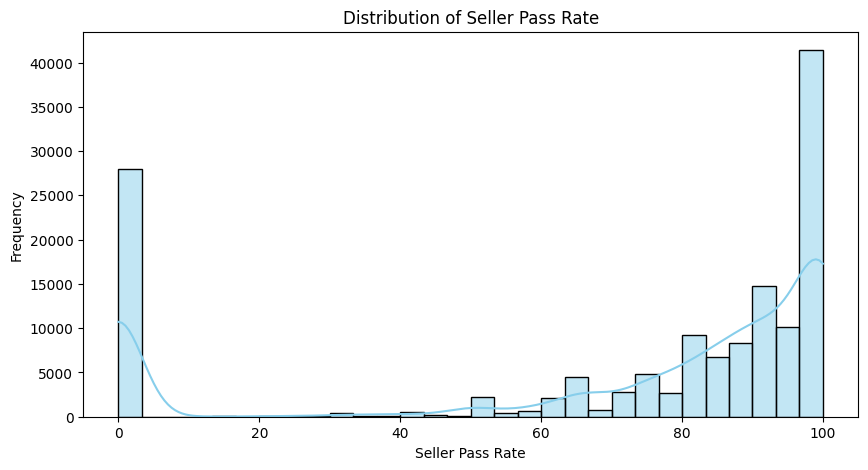

In [104]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 5))
sns.histplot(df['seller_pass_rate'], bins=30, kde=True, color='skyblue')
plt.title('Distribution of Seller Pass Rate')
plt.xlabel('Seller Pass Rate')
plt.ylabel('Frequency')
plt.show()


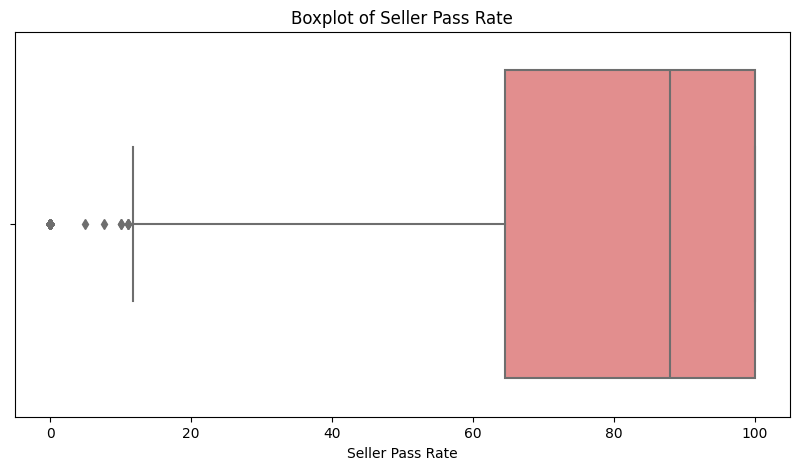

In [105]:
plt.figure(figsize=(10, 5))
sns.boxplot(x=df['seller_pass_rate'], color='lightcoral')
plt.title('Boxplot of Seller Pass Rate')
plt.xlabel('Seller Pass Rate')
plt.show()

#but these outliers are valid extreme cases and should be included in the analysis